In [19]:
import pickle
import pandas as pd



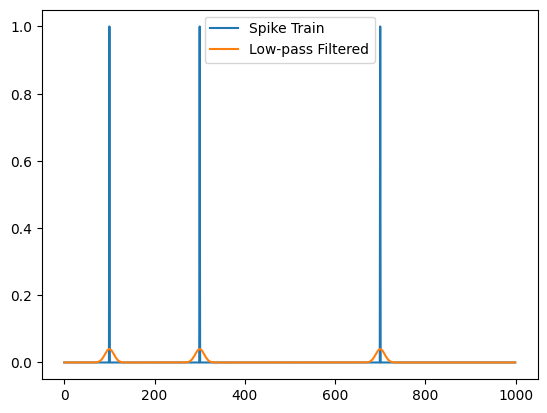

In [4]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import gaussian_filter1d

def gaussian_lowpass(spike_train, sigma=5):
    """
    Apply a Gaussian low-pass filter along the time axis.
    
    Parameters:
    - spike_train: np.array of shape [neurons, time]
    - sigma: std dev in number of time bins
    
    Returns:
    - filtered: np.array of same shape
    """
    return gaussian_filter1d(spike_train, sigma=sigma, axis=-1)
spike_train = np.zeros(1000)
spike_train[[100, 300, 700]] = 1  # three spikes
smoothed = gaussian_lowpass(spike_train[None, :], sigma=10)[0]

plt.plot(spike_train, label='Spike Train')
plt.plot(smoothed, label='Low-pass Filtered')
plt.legend()
plt.show()

In [20]:
with open('/Users/stevenwendel/Documents/GitHub/bg/pass_data_8_fix2.pkl', 'rb') as file:
    results = pickle.load(file)


In [21]:
display(results)

{'fully_reduced_dnas':                                                   dna  dna_score  \
 0   [391, 0, 0, 777, -21, -10, 0, 0, -60, 0, 0, 0,...        737   
 1   [426, 0, 0, 356, -118, 0, 0, 0, -42, 0, 0, 0, ...        736   
 2   [1000, 0, 0, 1000, -17, -886, 0, 0, -16, 0, 0,...        736   
 3   [765, 0, 0, 816, -17, -11, 0, 0, -5, 0, 0, 0, ...        736   
 4   [401, 0, 0, 1000, -52, -202, 0, 0, -3, 0, 0, 0...        736   
 ..                                                ...        ...   
 76  [961, 0, 0, 571, -45, -320, 0, 0, 0, 0, 0, 0, ...        730   
 77  [1000, 0, 0, 1000, -10, 0, 0, 0, -181, 0, 0, 0...        734   
 78  [585, 0, 0, 0, 0, 0, 0, 0, -42, 0, 0, 0, -73, ...        730   
 79  [149, 0, 0, 0, 0, 0, 0, 0, -42, 0, 0, 0, -209,...        730   
 80  [1000, 0, 0, 0, 0, 0, 0, 0, -181, 0, 0, 0, -17...        730   
 
                                file  
 0         I_2025-02-14_01-24-49.pkl  
 1   explore_2025-02-13_23-25-38.pkl  
 2         I_2025-02-14_01-24-4

In [15]:
red_dnas = pd.DataFrame(results['fully_reduced_dnas'])


In [16]:
red_dnas = red_dnas.sort_values(by=['dna_score', 'file'], ascending=False)

In [17]:
# Convert DNA lists to tuples for duplicate detection
results['fully_reduced_dnas']['dna_tuple'] = results['fully_reduced_dnas']['dna'].apply(tuple)

# Remove duplicates based on DNA sequence
results['fully_reduced_dnas'] = results['fully_reduced_dnas'].drop_duplicates(subset=['dna_tuple'])

# Remove the temporary tuple column
results['fully_reduced_dnas'] = results['fully_reduced_dnas'].drop('dna_tuple', axis=1)

# Print the number of unique sequences
print(f"Number of unique sequences: {len(results['fully_reduced_dnas'])}")

# Print the first few rows to verify
print("\nFirst few rows after removing duplicates:")
print(results['fully_reduced_dnas'].head())

Number of unique sequences: 81

First few rows after removing duplicates:
                                                 dna  dna_score  \
0  [391, 0, 0, 777, -21, -10, 0, 0, -60, 0, 0, 0,...        737   
1  [426, 0, 0, 356, -118, 0, 0, 0, -42, 0, 0, 0, ...        736   
2  [1000, 0, 0, 1000, -17, -886, 0, 0, -16, 0, 0,...        736   
3  [765, 0, 0, 816, -17, -11, 0, 0, -5, 0, 0, 0, ...        736   
4  [401, 0, 0, 1000, -52, -202, 0, 0, -3, 0, 0, 0...        736   

                              file  
0        I_2025-02-14_01-24-49.pkl  
1  explore_2025-02-13_23-25-38.pkl  
2        I_2025-02-14_01-24-49.pkl  
3        I_2025-02-14_01-24-49.pkl  
4        I_2025-02-14_01-24-49.pkl  


In [18]:
# Optional:Check the matrix and plots for single DNA
from src.neuron import *
from src.utils import *
from src.constants import * 
from src.network import *
from src.validation import *
from src.viz import *
from src.genetic_algorithm import *

curr_dna = red_dnas.iloc[0]['dna']
# Load DNA
dna_matrix = load_dna(curr_dna)

## IS THE SCORING FUCKED UP OR WHAT?

# === Preparing Network === 
all_neurons = create_neurons()
splits, input_waves, alpha_array = create_experiment()
criteria_dict = define_criteria()
max_score = TMAX//BIN_SIZE * len(CRITERIA_NAMES)

dna_score, neuron_data = evaluate_dna(
                dna_matrix=dna_matrix,
                neurons=all_neurons,
                alpha_array=alpha_array,
                input_waves=input_waves,
                criteria=criteria_dict,
                curr_dna=curr_dna
                )
total_score = sum(dna_score.values())
print(f'    === DNA: {curr_dna}') 
print(f'    === Control: {dna_score["control"]}/{max_score}')
print(f'    === Experimental: {dna_score["experimental"]}/{max_score}')
print(f'    === Overall: {total_score}({total_score/(2*max_score):.2%})')
print('\n')

# STRUCTURE OF NEURON_DATA
# neuron_data = {
#     'experimental': {
#         'neuron_name': {
#             'hist_V': np.array(),
#             'spike_times': np.array()
#         },
#     'control': {
#         'neuron_name': {
#             'hist_V': np.array(),
#             'spike_times': np.array()
#             }
#         }
#     }
# }


diagnostic = {
        'show_dna_matrix' : True,
        'show_neuron_plots' : True,
        'show_difference_histogram' : False,
        'show_dna_scores': False
    }


if diagnostic['show_dna_matrix']:
                print("Currently loaded matrix ---")
                display_matrix(dna_matrix, NEURON_NAMES)

if diagnostic['show_dna_scores']:
                print(f'{dna_score=}: {curr_dna}')
            
if diagnostic['show_neuron_plots']:
                for condition in ['experimental', 'control']:
                    target_neurons_hist_Vs = np.array([neuron_data[condition][name]['hist_V'] for name in NEURON_NAMES])
                    plot_neurons_interactive(hist_Vs=target_neurons_hist_Vs, neuron_names=NEURON_NAMES, sq_wave=input_waves[0], go_wave=input_waves[1], show_u=False)
                    

    === DNA: [391, 0, 0, 777, -21, -10, 0, 0, -60, 0, 0, 0, -25, 0, 0, -2, -652, 0, 0, 90, 0, 0, 0, 0, 999, 148, 0, 0, -3, 0, 0, 200, 101, 200, 0, 0, 0, 0, 0, 0, 0, 0, -162, 0, 0, 0, 32, 738, 123]
    === Control: 222/500
    === Experimental: 489/500
    === Overall: 711(71.10%)


Currently loaded matrix ---


,Somat,MSN1,SNR1,VMprep,ALMprep,MSN2,SNR2,PPN,THALgo,ALMinter,MSN3,SNR3,ALMresp,VMresp
Somat,0.0,777.0,0.0,0.0,391.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MSN1,0.0,0.0,-21.0,0.0,0.0,0.0,-10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SNR1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
VMprep,0.0,0.0,0.0,0.0,90.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ALMprep,0.0,0.0,0.0,101.0,0.0,148.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MSN2,0.0,0.0,0.0,0.0,0.0,0.0,-60.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SNR2,0.0,0.0,0.0,-2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-652.0
PPN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,0.0
THALgo,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,738.0,0.0,0.0,123.0,0.0
ALMinter,0.0,0.0,0.0,0.0,-162.0,0.0,0.0,0.0,0.0,0.0,-3.0,0.0,0.0,0.0
